# Data Analysis

In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score, accuracy_score
from sklearn.ensemble import RandomForestClassifier
import tensorflow as tf
from tensorflow.keras import layers, models, utils

# Load dataset
df = pd.read_csv('/content/AllData.csv')

# Drop unnecessary columns
df = df.drop(['Time', 'Person'], axis=1)




/tmp/ipython-input-30-959727514.py:14: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




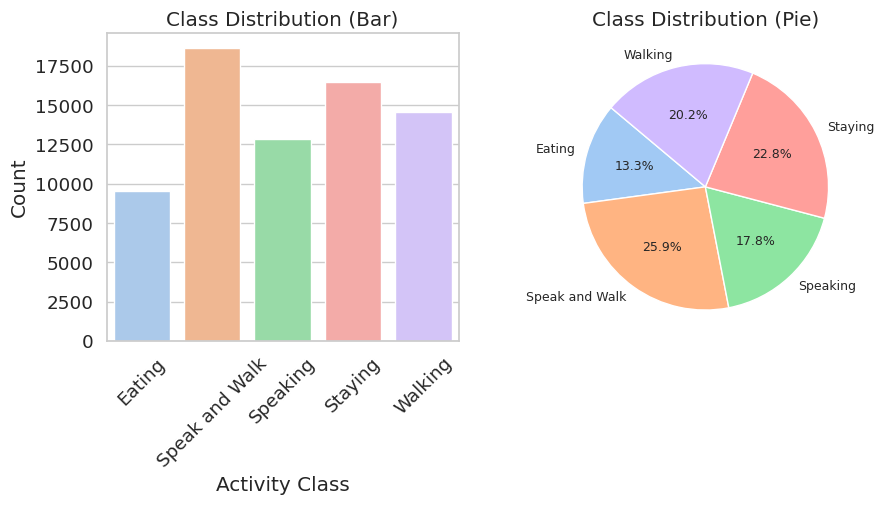

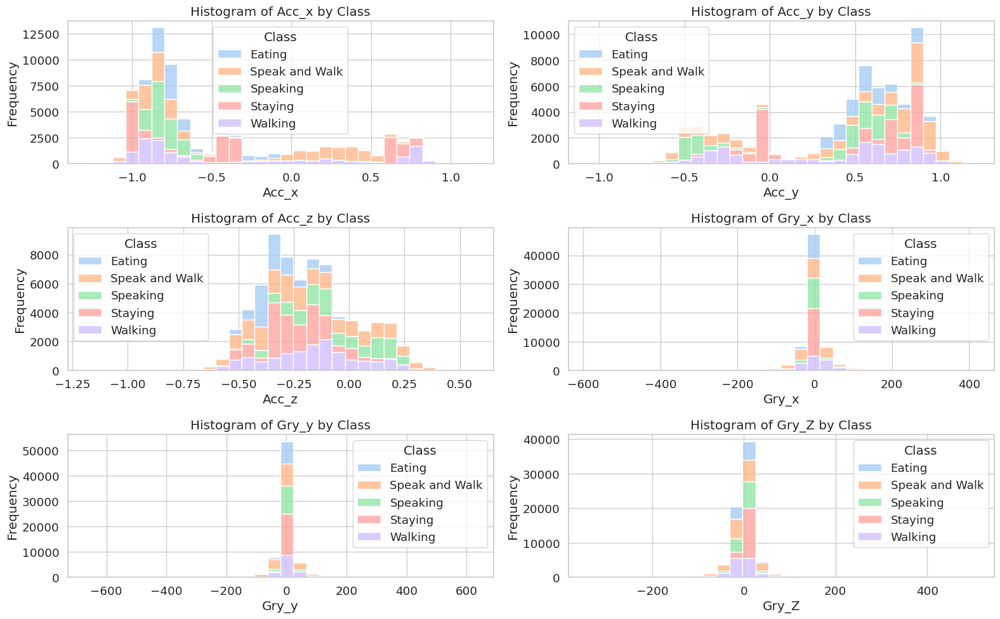

/tmp/ipython-input-30-959727514.py:41: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


/tmp/ipython-input-30-959727514.py:41: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


/tmp/ipython-input-30-959727514.py:41: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


/tmp/ipython-input-30-959727514.py:41: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


/tmp/ipython-input-30-959727514.py:41: FutureWarning:



Passing `palette` without assigning `hue` is de

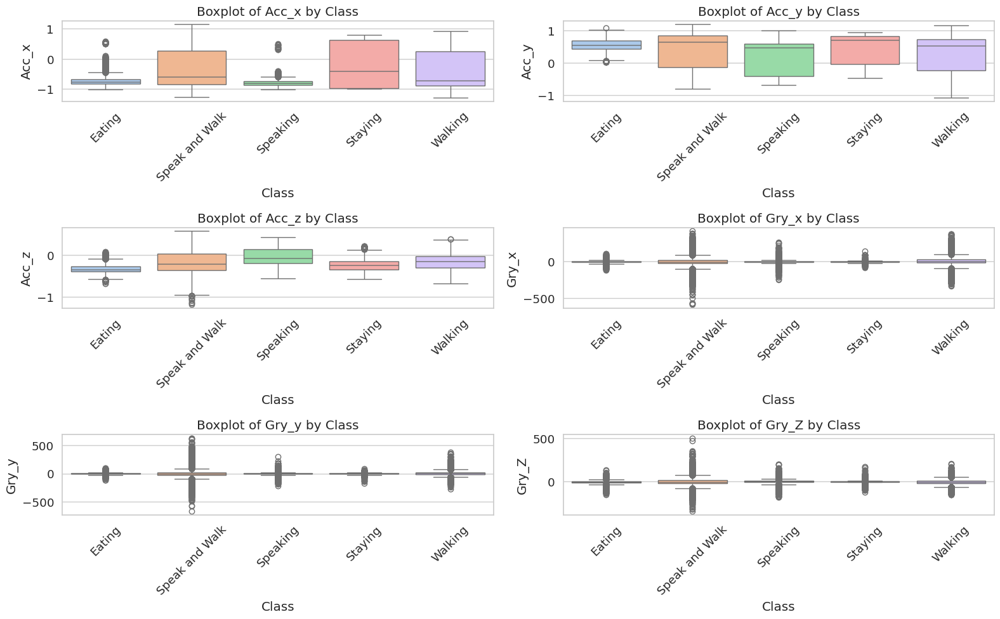

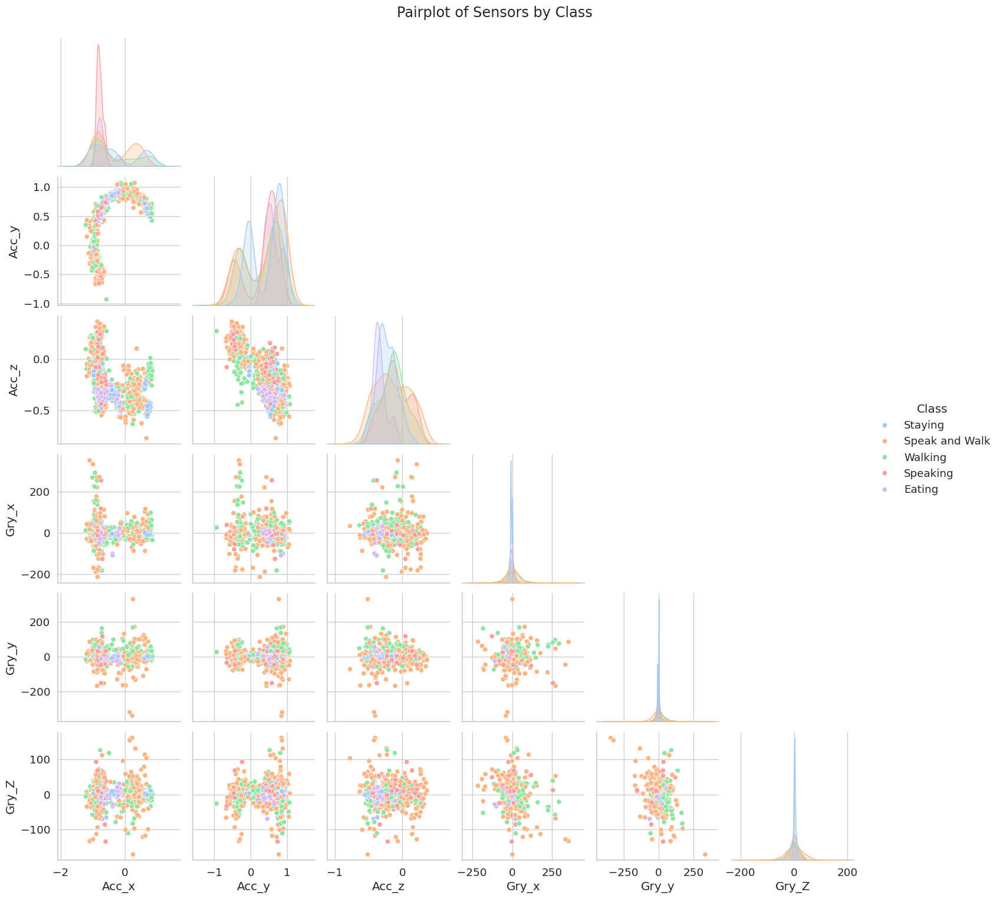

In [30]:
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import pandas as pd

sensor_cols = ['Acc_x', 'Acc_y', 'Acc_z', 'Gry_x', 'Gry_y', 'Gry_Z']

# 1. Class Distribution Bar + Pie Charts

class_counts = df['Class'].value_counts().sort_index()

plt.figure(figsize=(10,4))
plt.subplot(1,2,1)
sns.barplot(x=class_counts.index, y=class_counts.values, palette='pastel')
plt.title('Class Distribution (Bar)')
plt.xlabel('Activity Class')
plt.ylabel('Count')
plt.xticks(rotation=45)

plt.subplot(1,2,2)
plt.pie(class_counts.values, labels=class_counts.index, autopct='%1.1f%%',
        colors=sns.color_palette("pastel").as_hex(), startangle=140, textprops={'fontsize': 9})
plt.title('Class Distribution (Pie)')

# 2. Histograms for all sensor features combined
plt.figure(figsize=(16,10))
for i, col in enumerate(sensor_cols):
    plt.subplot(3, 2, i+1)
    sns.histplot(data=df, x=col, hue='Class', multiple='stack', bins=30, palette='pastel')
    plt.title(f'Histogram of {col} by Class')
    plt.xlabel(col)
    plt.ylabel('Frequency')
plt.tight_layout()
plt.show()


# 3. Boxplots (or violin) for all sensors by Class to show distribution & spread
plt.figure(figsize=(16,10))
for i, col in enumerate(sensor_cols):
    plt.subplot(3, 2, i+1)
    sns.boxplot(x='Class', y=col, data=df, palette='pastel')
    plt.title(f'Boxplot of {col} by Class')
    plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


# 4. Bonus: Pairplot for sensor features colored by Class (subset if too big)
# Warning: can be slow for large data, consider sampling

sampled_df = df.sample(n=1000, random_state=42) if len(df) > 1000 else df

sns.pairplot(sampled_df, vars=sensor_cols, hue='Class', palette='pastel', corner=True)
plt.suptitle('Pairplot of Sensors by Class', y=1.02)
plt.show()

**Parallel Coordinates Plot**


Visualize sensor feature distributions across activities in one multidimensional plot.

In [35]:
import plotly.express as px

# Encode Class labels to integers
df['Class_code'] = df['Class'].astype('category').cat.codes
class_names = df['Class'].astype('category').cat.categories

# Pick as many colors as classes
num_classes = len(class_names)
color_sequence = px.colors.qualitative.Pastel[:num_classes]

fig = px.parallel_coordinates(
    df,
    color='Class_code',  # numeric
    dimensions=sensor_cols,
    color_continuous_scale=color_sequence,
    labels={col: col for col in sensor_cols},
    title="Parallel Coordinates Plot of Sensors by Activity"
)

# Customize colorbar ticks to show class names
fig.update_layout(coloraxis_colorbar=dict(
    tickvals=list(range(num_classes)),
    ticktext=list(class_names),
    title="Activity Class"
))

fig.show()


**Boxen Plot (Letter-value plot)**

Better for large datasets, shows distribution tails for sensor features by class.

/tmp/ipython-input-36-2699603844.py:4: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


/tmp/ipython-input-36-2699603844.py:4: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


/tmp/ipython-input-36-2699603844.py:4: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


/tmp/ipython-input-36-2699603844.py:4: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


/tmp/ipython-input-36-2699603844.py:4: FutureWarning:



Passing `palette` without assigning `hue` is de

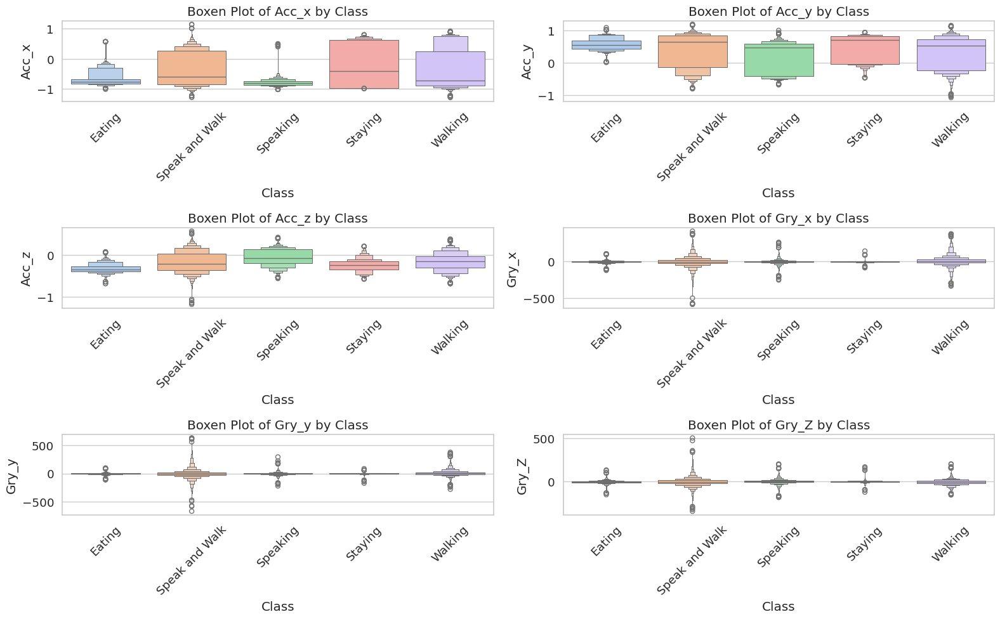

In [36]:
plt.figure(figsize=(16,10))
for i, col in enumerate(sensor_cols):
    plt.subplot(3, 2, i+1)
    sns.boxenplot(x='Class', y=col, data=df, palette='pastel')
    plt.title(f'Boxen Plot of {col} by Class')
    plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [37]:
pip install joypy

**Density Ridge Plot (Joyplot)**

<Figure size 1000x600 with 0 Axes>

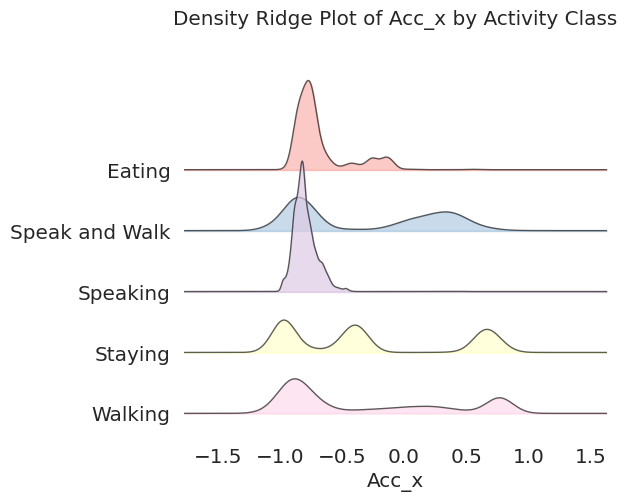

<Figure size 1000x600 with 0 Axes>

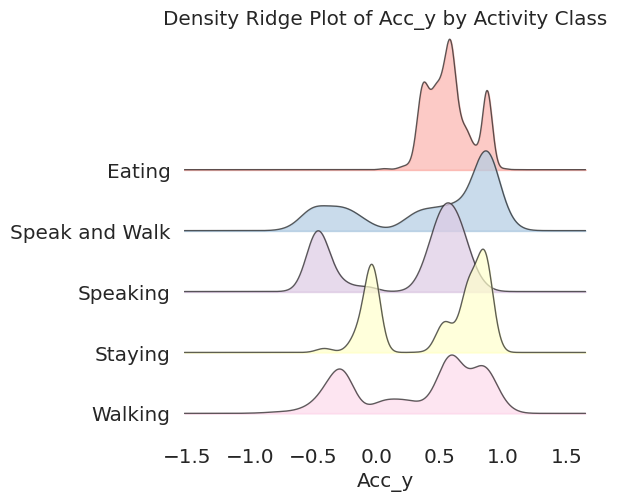

<Figure size 1000x600 with 0 Axes>

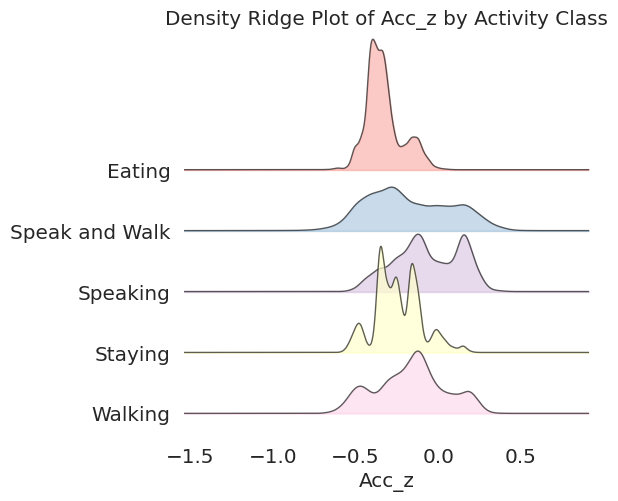

<Figure size 1000x600 with 0 Axes>

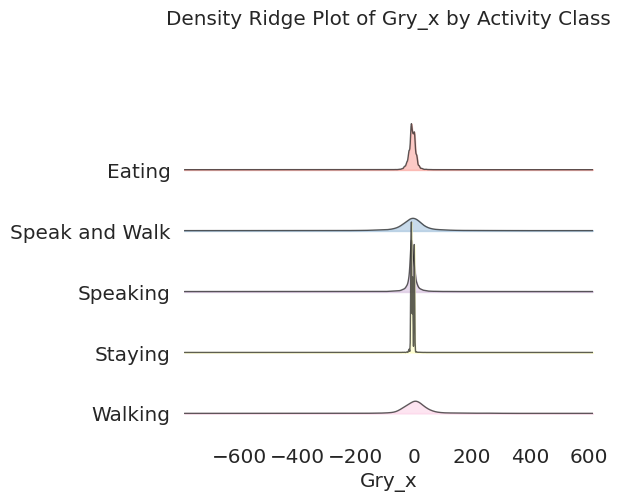

<Figure size 1000x600 with 0 Axes>

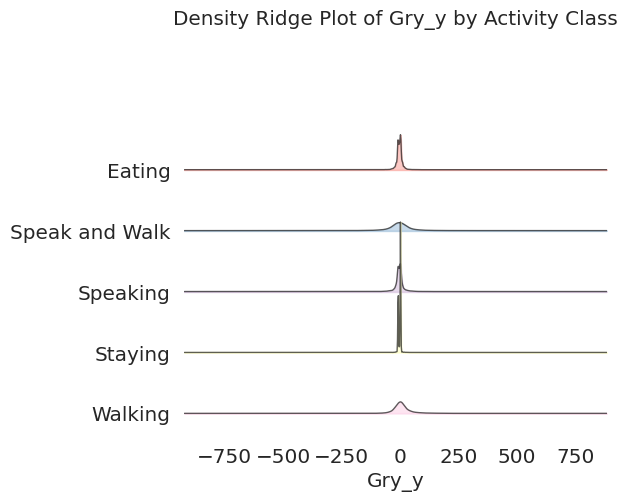

<Figure size 1000x600 with 0 Axes>

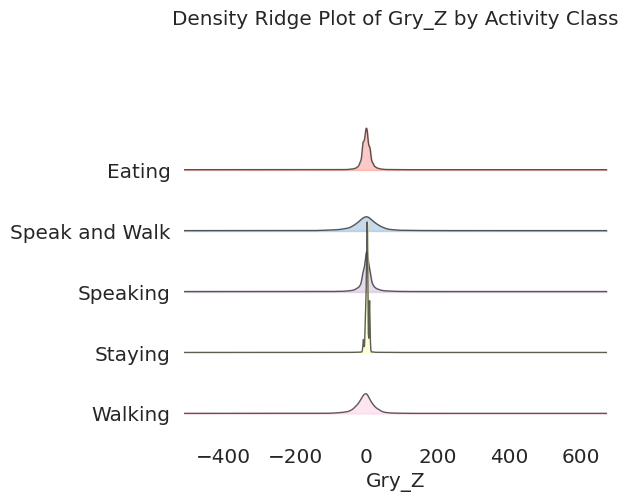

In [42]:
import joypy
import matplotlib.pyplot as plt

for col in sensor_cols:
    plt.figure(figsize=(10, 6))
    joypy.joyplot(
        df,
        by='Class',
        column=col,
        colormap=plt.cm.Pastel1,
        alpha=0.7,
        linewidth=1
    )
    plt.title(f'Density Ridge Plot of {col} by Activity Class')
    plt.xlabel(col)
    plt.show()


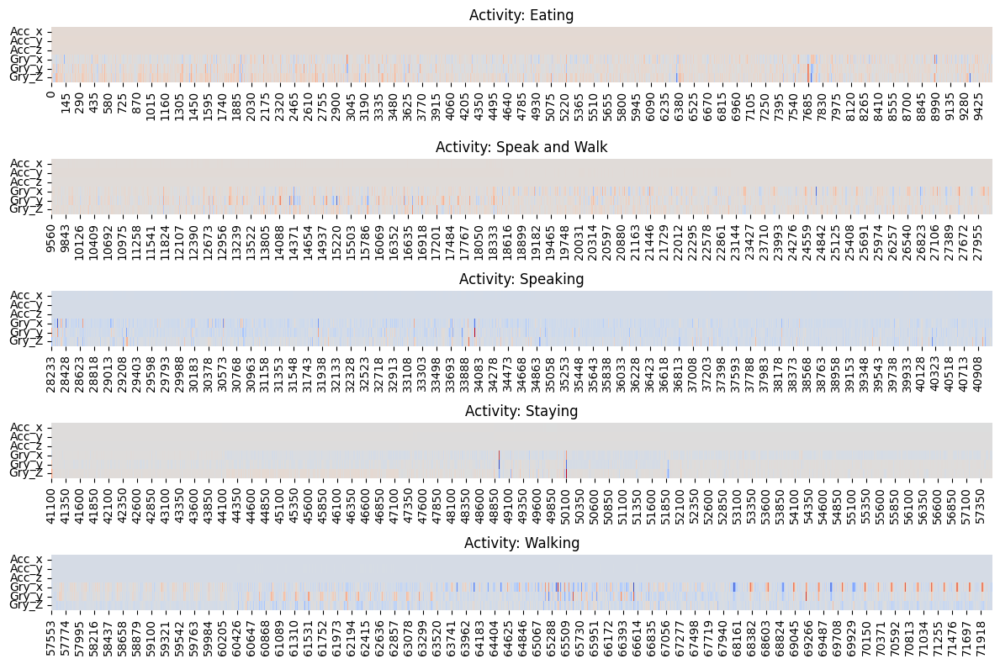

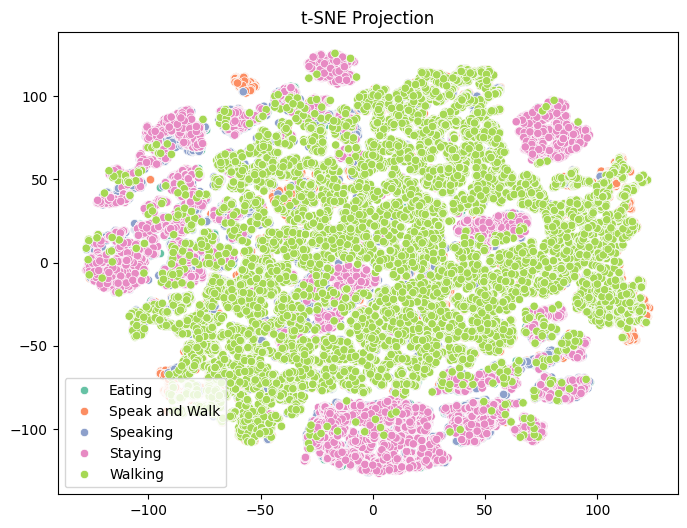

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from scipy import signal
from collections import Counter
from sklearn.manifold import TSNE, MDS

# Load dataset (raw data, no encoding/scaling)
df = pd.read_csv('/content/AllData.csv')
sensor_cols = ['Acc_x', 'Acc_y', 'Acc_z', 'Gry_x', 'Gry_y', 'Gry_Z']
activity_labels = df['Class'].unique()

# ------------------ 1. Activity-Specific Time-Series Heatmaps ------------------
plt.figure(figsize=(12, 8))
for idx, act in enumerate(activity_labels):
    plt.subplot(len(activity_labels), 1, idx+1)
    act_data = df[df['Class'] == act][sensor_cols]
    sns.heatmap(act_data.T, cbar=False, cmap='coolwarm')
    plt.title(f'Activity: {act}')
plt.tight_layout()
plt.show()

# ------------------ 2. t-SNE / MDS Scatter Plots ------------------
X = df[sensor_cols].values
y = df['Class'].values

# t-SNE
tsne = TSNE(n_components=2, random_state=42, perplexity=30)
X_tsne = tsne.fit_transform(X)
plt.figure(figsize=(8, 6))
sns.scatterplot(x=X_tsne[:, 0], y=X_tsne[:, 1], hue=y, palette='Set2')
plt.title("t-SNE Projection")
plt.show()

# MDS
mds = MDS(n_components=2, random_state=42)
X_mds = mds.fit_transform(X)
plt.figure(figsize=(8, 6))
sns.scatterplot(x=X_mds[:, 0], y=X_mds[:, 1], hue=y, palette='Set2')
plt.title("MDS Projection")
plt.show()

# ------------------ 3. Interactive 3D Scatter Plot ------------------
fig = px.scatter_3d(x=X_tsne[:, 0], y=X_tsne[:, 1], z=X_tsne[:, 0]*0,
                    color=df['Class'],
                    title="3D Interactive Scatter (t-SNE Flat Z)")
fig.show()

# ------------------ 4. Violin Plots by Activity ------------------
plt.figure(figsize=(15, 10))
for idx, col in enumerate(sensor_cols):
    plt.subplot(2, 3, idx+1)
    sns.violinplot(x='Class', y=col, data=df, palette='Set2')
    plt.title(f'{col} Distribution by Activity')
plt.tight_layout()
plt.show()

# ------------------ 5. Radar (Spider) Charts ------------------
agg = df.groupby('Class')[sensor_cols].mean()
categories = list(sensor_cols)

for idx, (label, row) in enumerate(agg.iterrows()):
    values = row.values.tolist()
    values += values[:1]  # Loop back for radar
    angles = np.linspace(0, 2 * np.pi, len(categories) + 1)

    plt.figure(figsize=(6, 6))
    ax = plt.subplot(111, polar=True)
    plt.xticks(angles[:-1], categories)
    ax.plot(angles, values, linewidth=2, label=f'{label}')
    ax.fill(angles, values, alpha=0.25)
    plt.title(f'{label} Radar Chart')
    plt.legend()
    plt.show()

# ------------------ 6. Correlation Matrix Heatmap ------------------
corr = df[sensor_cols].corr()
sns.heatmap(corr, annot=True, cmap='coolwarm')
plt.title('Sensor Feature Correlation')
plt.show()

# ------------------ 7. Sankey Diagram for State Transitions ------------------
df_sorted = df.sort_values(by='Time')
activity_sequence = df_sorted['Class'].values

transitions = list(zip(activity_sequence[:-1], activity_sequence[1:]))
counter = Counter(transitions)

labels = list(df['Class'].unique())
source, target, value = [], [], []
for (src, tgt), cnt in counter.items():
    source.append(labels.index(src))
    target.append(labels.index(tgt))
    value.append(cnt)

fig = go.Figure(data=[go.Sankey(
    node=dict(label=labels),
    link=dict(source=source, target=target, value=value)
)])
fig.update_layout(title_text="Activity State Transition Sankey Diagram", font_size=10)
fig.show()

# ------------------ 8. Wavelet "Signature" Spectrograms ------------------
for act in activity_labels:
    subset = df[df['Class'] == act]
    signal_data = subset['Acc_x'].values[:512]  # Use first 512 samples for clarity

    widths = np.arange(1, 31)
    cwtmatr = signal.cwt(signal_data, signal.ricker, widths)

    plt.figure(figsize=(10, 4))
    plt.imshow(cwtmatr, extent=[0, len(signal_data), 1, 31], cmap='jet', aspect='auto',
               vmax=abs(cwtmatr).max(), vmin=-abs(cwtmatr).max())
    plt.title(f'Wavelet Spectrogram - {act}')
    plt.ylabel('Scale')
    plt.xlabel('Sample Index')
    plt.colorbar(label='Amplitude')
    plt.show()


/tmp/ipython-input-1-1237253597.py:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Class', y=col, data=df, palette='Set2')
/tmp/ipython-input-1-1237253597.py:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Class', y=col, data=df, palette='Set2')
/tmp/ipython-input-1-1237253597.py:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Class', y=col, data=df, palette='Set2')
/tmp/ipython-input-1-1237253597.py:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the

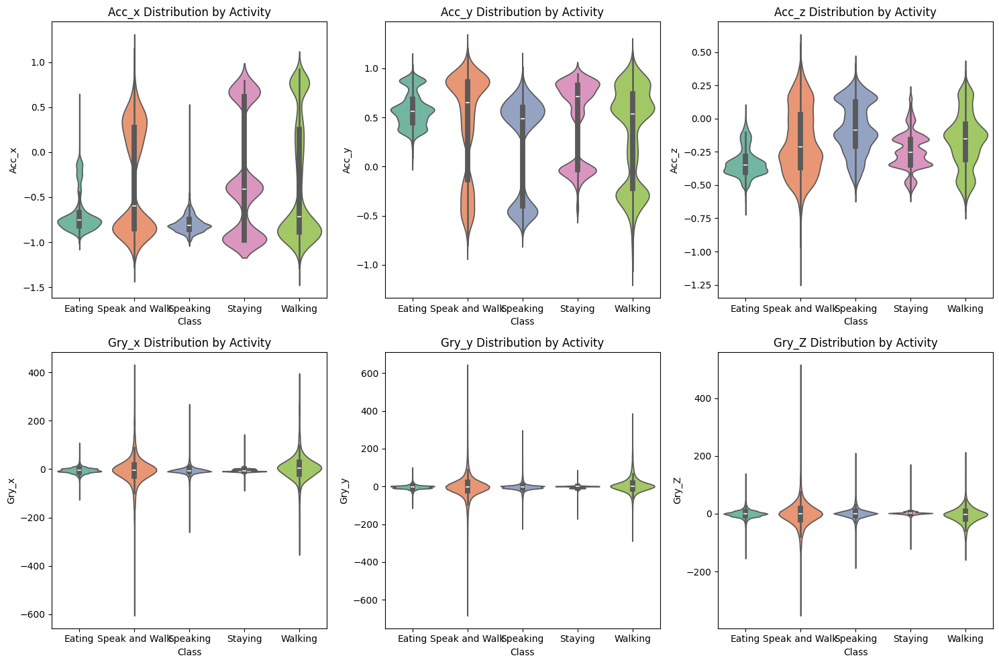

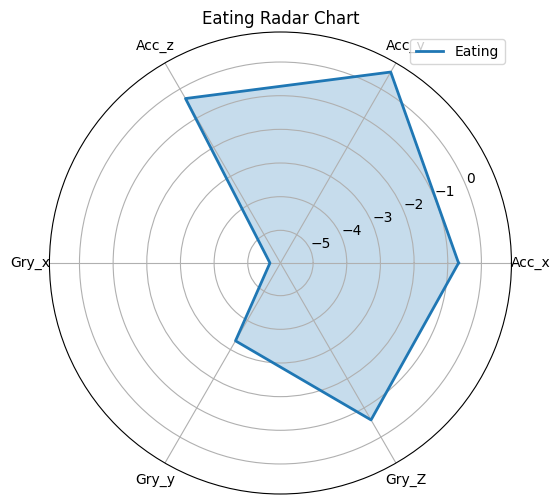

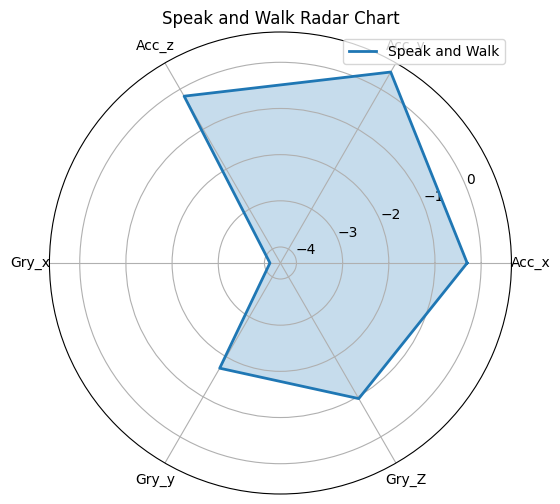

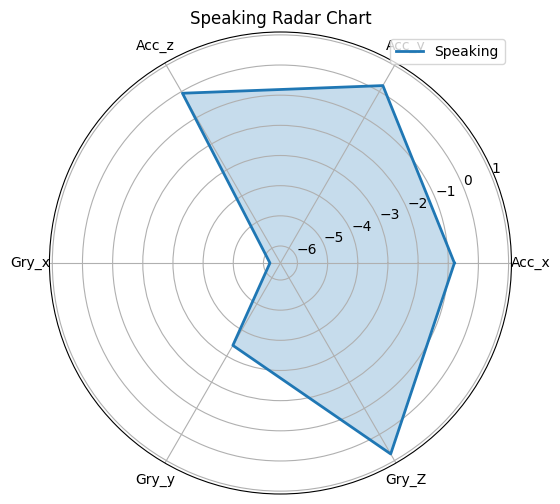

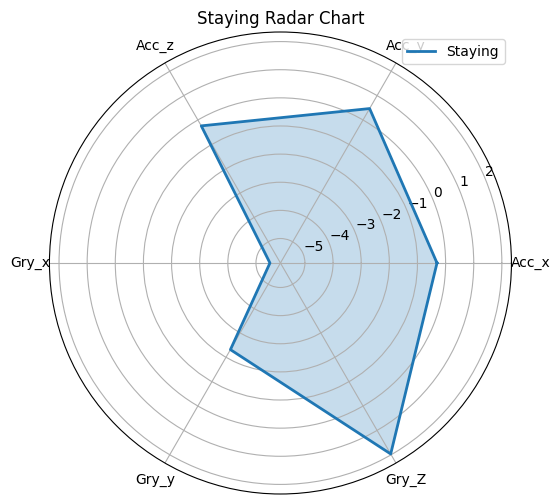

...

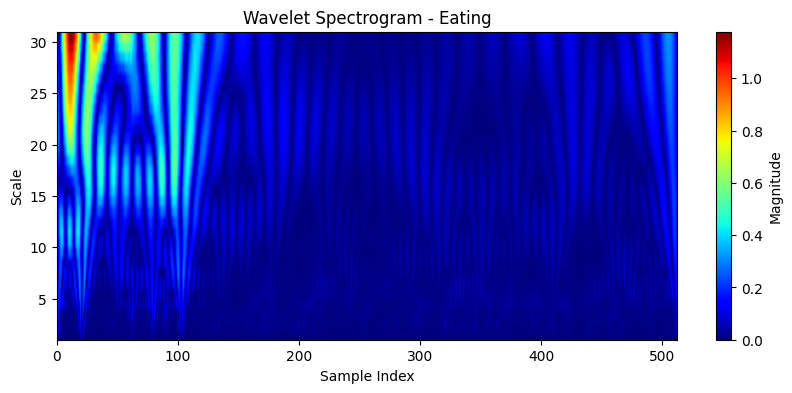

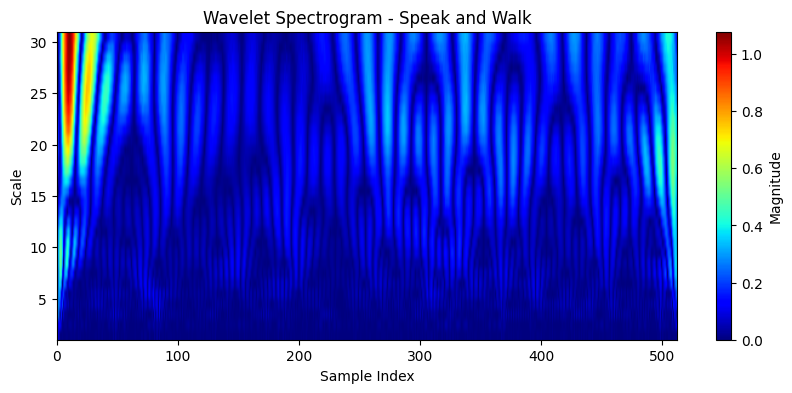

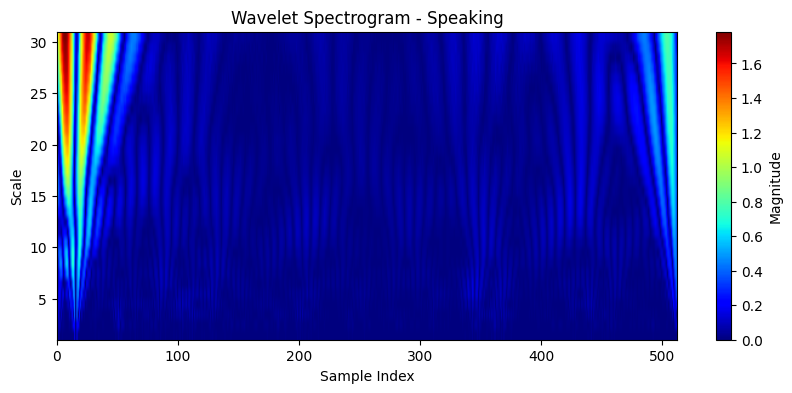

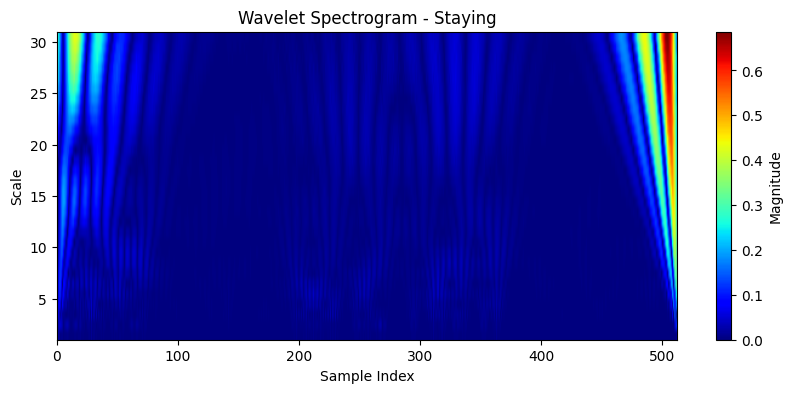

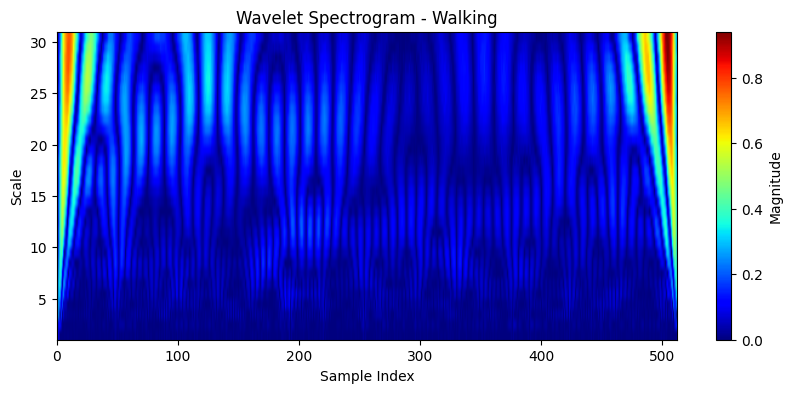

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from scipy import signal
from collections import Counter
from sklearn.manifold import TSNE, MDS

# Load dataset (raw data, no encoding/scaling)
df = pd.read_csv('/content/AllData.csv')
sensor_cols = ['Acc_x', 'Acc_y', 'Acc_z', 'Gry_x', 'Gry_y', 'Gry_Z']
activity_labels = df['Class'].unique()
# ------------------ 2. t-SNE / MDS Scatter Plots ------------------
X = df[sensor_cols].values
y = df['Class'].values


# ------------------ 4. Violin Plots by Activity ------------------
plt.figure(figsize=(15, 10))
for idx, col in enumerate(sensor_cols):
    plt.subplot(2, 3, idx+1)
    sns.violinplot(x='Class', y=col, data=df, palette='Set2')
    plt.title(f'{col} Distribution by Activity')
plt.tight_layout()
plt.show()

# ------------------ 5. Radar (Spider) Charts ------------------
agg = df.groupby('Class')[sensor_cols].mean()
categories = list(sensor_cols)

for idx, (label, row) in enumerate(agg.iterrows()):
    values = row.values.tolist()
    values += values[:1]  # Loop back for radar
    angles = np.linspace(0, 2 * np.pi, len(categories) + 1)

    plt.figure(figsize=(6, 6))
    ax = plt.subplot(111, polar=True)
    plt.xticks(angles[:-1], categories)
    ax.plot(angles, values, linewidth=2, label=f'{label}')
    ax.fill(angles, values, alpha=0.25)
    plt.title(f'{label} Radar Chart')
    plt.legend()
    plt.show()

# ------------------ 6. Correlation Matrix Heatmap ------------------
corr = df[sensor_cols].corr()
sns.heatmap(corr, annot=True, cmap='coolwarm')
plt.title('Sensor Feature Correlation')
plt.show()

# ------------------ 7. Sankey Diagram for State Transitions ------------------
df_sorted = df.sort_values(by='Time')
activity_sequence = df_sorted['Class'].values

transitions = list(zip(activity_sequence[:-1], activity_sequence[1:]))
counter = Counter(transitions)

labels = list(df['Class'].unique())
source, target, value = [], [], []
for (src, tgt), cnt in counter.items():
    source.append(labels.index(src))
    target.append(labels.index(tgt))
    value.append(cnt)

fig = go.Figure(data=[go.Sankey(
    node=dict(label=labels),
    link=dict(source=source, target=target, value=value)
)])
fig.update_layout(title_text="Activity State Transition Sankey Diagram", font_size=10)
fig.show()

import pywt
import numpy as np
import matplotlib.pyplot as plt

# ------------------ 8. Wavelet "Signature" Spectrograms ------------------
for act in activity_labels:
    subset = df[df['Class'] == act]
    signal_data = subset['Acc_x'].values[:512]  # Use first 512 samples for clarity

    # Use Continuous Wavelet Transform from PyWavelets
    scales = np.arange(1, 31)
    coefficients, freqs = pywt.cwt(signal_data, scales, 'morl')

    plt.figure(figsize=(10, 4))
    plt.imshow(np.abs(coefficients), extent=[0, len(signal_data), 1, 31], cmap='jet', aspect='auto',
               vmax=np.abs(coefficients).max(), vmin=0, origin='lower')
    plt.title(f'Wavelet Spectrogram - {act}')
    plt.ylabel('Scale')
    plt.xlabel('Sample Index')
    plt.colorbar(label='Magnitude')
    plt.show()

# Activity Transition Sankey Diagram

In [27]:
import plotly.graph_objects as go
from collections import Counter
import colorsys

# Ensure data is sorted by time for transitions
df_sorted = df.sort_values(by='Time')

activity_sequence = df_sorted['Class'].values
transitions = list(zip(activity_sequence[:-1], activity_sequence[1:]))
counter = Counter(transitions)

activity_labels = sorted(df['Class'].unique())
label_to_idx = {label: i for i, label in enumerate(activity_labels)}

source, target, value = [], [], []
for (src, tgt), cnt in counter.items():
    if src != tgt:
        source.append(label_to_idx[src])
        target.append(label_to_idx[tgt])
        value.append(cnt)

# Generate pastel colors by varying hue, with fixed high lightness and low saturation
def pastel_color(h):
    # h: hue from 0 to 1
    l = 0.4  # lightness high for pastel
    s = 0.4  # saturation low for softness
    r, g, b = colorsys.hls_to_rgb(h, l, s)
    return f'rgba({int(r*255)}, {int(g*255)}, {int(b*255)}, 0.8)'

num_labels = len(activity_labels)
node_colors = [pastel_color(i / num_labels) for i in range(num_labels)]

# Link colors same as source node but with more transparency
link_colors = [node_colors[src].replace("0.8", "0.3") for src in source]

fig = go.Figure(data=[go.Sankey(
    arrangement="snap",
    node=dict(
        pad=20,
        thickness=20,
        line=dict(color="black", width=0.9),  # strong border for clarity
        label=activity_labels,
        color=node_colors
    ),
    link=dict(
        source=source,
        target=target,
        value=value,
        color=link_colors
    )
)])

fig.update_layout(
    title_text="Activity Transition Sankey Diagram",
    title_x=0.5,          # centers the title
    font=dict(size=21),
    height=600
)

fig.show()


# Joint Feature Heatmap per Transition

This plot will show average sensor feature values conditioned on activity transitions. Example: "Eating → Walking" might have distinct acceleration and gyroscope patterns.

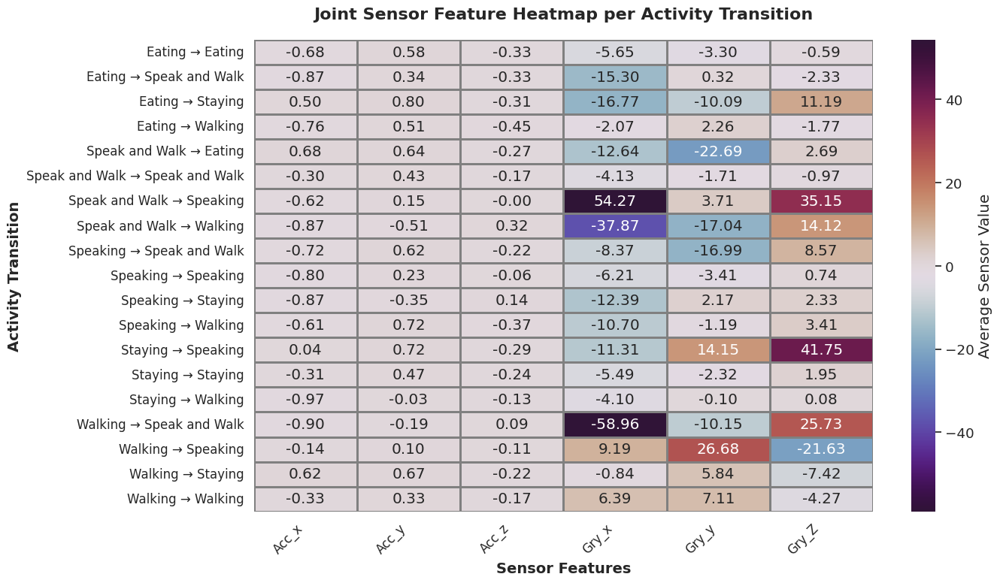

In [13]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Assume df is loaded and preprocessed
sensor_features = ['Acc_x', 'Acc_y', 'Acc_z', 'Gry_x', 'Gry_y', 'Gry_Z']
df_sorted = df.sort_values(by='Time')
classes = df_sorted['Class'].values

# Create transition labels
transitions = [f"{a} → {b}" for a, b in zip(classes[:-1], classes[1:])]
df_transitions = df_sorted.iloc[:-1].copy()
df_transitions['Transition'] = transitions

# Compute average sensor values per transition
heatmap_data = df_transitions.groupby('Transition')[sensor_features].mean()

# Plot heatmap with vivid color scheme
plt.figure(figsize=(14, 8))
sns.set(style="whitegrid", font_scale=1.2)

ax = sns.heatmap(
    heatmap_data,
    annot=True,
    fmt=".2f",
    cmap="twilight_shifted",  # More colorful and journal-friendly
    linewidths=1,
    linecolor='gray',
    cbar_kws={'label': 'Average Sensor Value'}
)

# Beautify axes and title
ax.set_title("Joint Sensor Feature Heatmap per Activity Transition", fontsize=16, fontweight='bold', pad=20)
ax.set_xlabel("Sensor Features", fontsize=14, fontweight='bold')
ax.set_ylabel("Activity Transition", fontsize=14, fontweight='bold')

# Rotate x-axis for clarity
plt.xticks(rotation=45, ha='right', fontsize=12)
plt.yticks(fontsize=12)

plt.tight_layout()
plt.show()


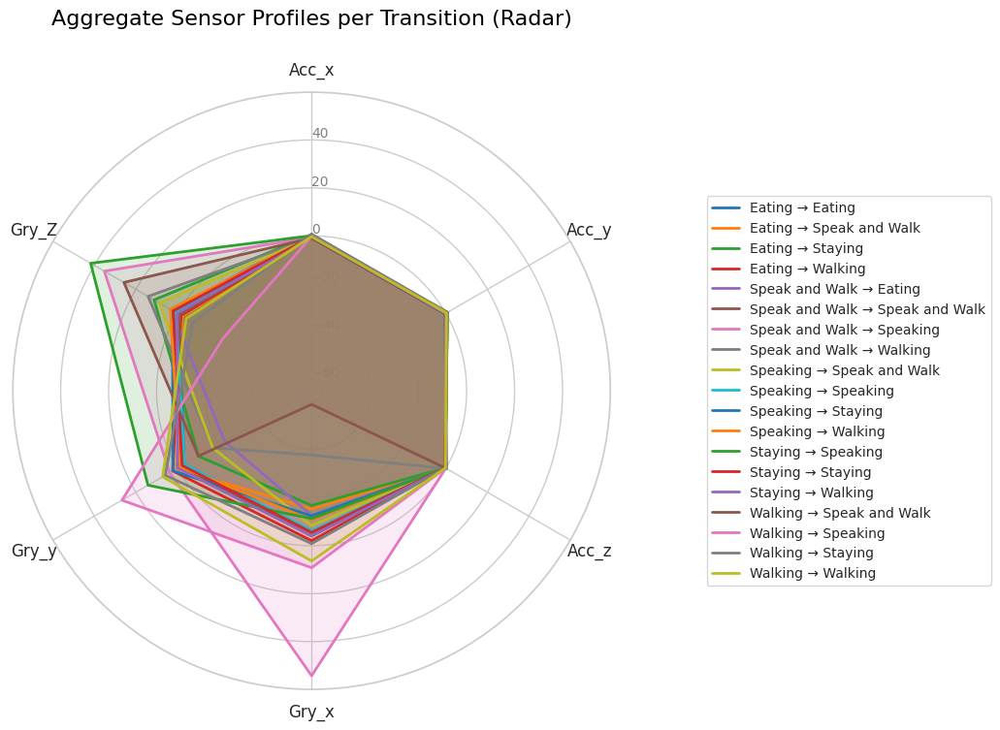

In [15]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Define function to create radar plots
def plot_transition_radar(data, sensor_features, title, colors):
    num_vars = len(sensor_features)
    angles = np.linspace(0, 2 * np.pi, num_vars, endpoint=False).tolist()
    angles += angles[:1]

    # Larger, wider figure
    fig, ax = plt.subplots(figsize=(12, 8), subplot_kw=dict(polar=True))

    for i, (label, row) in enumerate(data.iterrows()):
        values = row[sensor_features].tolist()
        values += values[:1]
        ax.plot(angles, values, label=label, linewidth=2, color=colors[i])
        ax.fill(angles, values, alpha=0.15, color=colors[i])

    ax.set_theta_offset(np.pi / 2)
    ax.set_theta_direction(-1)
    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(sensor_features, fontsize=12)

    ax.set_rlabel_position(0)
    plt.yticks(color="grey", size=10)
    plt.title(title, size=16, color='black', y=1.1)
    ax.legend(loc='center left', bbox_to_anchor=(1.15, 0.5), fontsize=10)
    plt.show()


# ------------ Prepare Data for Radar Plot ------------

sensor_features = ['Acc_x', 'Acc_y', 'Acc_z', 'Gry_x', 'Gry_y', 'Gry_Z']
df_sorted = df.sort_values(by='Time')
classes = df_sorted['Class'].values

# Create transition labels
transitions = [f"{a} → {b}" for a, b in zip(classes[:-1], classes[1:])]
df_transitions = df_sorted.iloc[:-1].copy()
df_transitions['Transition'] = transitions

# Compute mean per sensor for each transition
radar_data = df_transitions.groupby('Transition')[sensor_features].mean()

# Generate unique colors
import seaborn as sns
palette = sns.color_palette("tab10", len(radar_data))

# Plot radar chart
plot_transition_radar(radar_data, sensor_features,
                      title="Aggregate Sensor Profiles per Transition (Radar)",
                      colors=palette)


In [4]:
pip install scipy==1.11.3 PyWavelets


  Using cached scipy-1.11.3-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (60 kB)
  Using cached numpy-1.26.4-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (61 kB)
Using cached scipy-1.11.3-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (36.4 MB)
Using cached numpy-1.26.4-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (18.3 MB)
  Attempting uninstall: numpy
    Found existing installation: numpy 2.0.2
    Uninstalling numpy-2.0.2:
      Successfully uninstalled numpy-2.0.2
  Attempting uninstall: scipy
    Found existing installation: scipy 1.15.3
    Uninstalling scipy-1.15.3:
      Successfully uninstalled scipy-1.15.3
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
scikit-image 0.25.2 requires scipy>=1.11.4, but you have scipy 1.11.3 which is incompatible.
opencv-python-headless 4.12.0.88 re

# Original LSTM-Temporal-Multihead

In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score, accuracy_score
import tensorflow as tf
from tensorflow.keras import layers, models, utils, callbacks
import matplotlib.pyplot as plt
import seaborn as sns

# ------------- Load & Preprocess Dataset -------------
df = pd.read_csv("/content/AllData.csv")
df = df.drop(['Time', 'Person'], axis=1)

sensor_cols = ['Acc_x', 'Acc_y', 'Acc_z', 'Gry_x', 'Gry_y', 'Gry_Z']
df[sensor_cols] = (df[sensor_cols] - df[sensor_cols].mean()) / df[sensor_cols].std()

le = LabelEncoder()
df['Class'] = le.fit_transform(df['Class'])

# ------------- Sliding Window ------------------
window_size = 128
stride = window_size // 2
X, y = [], []
values = df[sensor_cols].values
labels = df['Class'].values

for start in range(0, len(values) - window_size + 1, stride):
    end = start + window_size
    X.append(values[start:end])
    y.append(np.bincount(labels[start:end]).argmax())
X = np.array(X)
y = np.array(y)

# ------------- Train-Test Split ------------------
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=42)
num_classes = len(np.unique(y))
y_train_cat = utils.to_categorical(y_train, num_classes)
y_test_cat = utils.to_categorical(y_test, num_classes)

# ------------- Temporal Positional Encoding ------------------
class TemporalPositionalEncoding(layers.Layer):
    def __init__(self, max_len=512, d_model=128):
        super().__init__()
        self.max_len = max_len
        self.d_model = d_model
        self.position = tf.range(max_len, dtype=tf.float32)[:, tf.newaxis]
        self.div_term = tf.exp(tf.range(0, d_model, 2, dtype=tf.float32) * (-np.log(10000.0) / d_model))

    def call(self, x):
        pe = np.zeros((self.max_len, self.d_model))
        pe[:, 0::2] = np.sin(self.position * self.div_term)
        pe[:, 1::2] = np.cos(self.position * self.div_term)
        pe = pe[tf.newaxis, :tf.shape(x)[1], :]
        return x + tf.cast(pe, dtype=x.dtype)

# ------------- Temporal Multi-Head Attention ------------------
class TemporalMultiHeadAttention(layers.Layer):
    def __init__(self, d_model, num_heads, max_len=512):
        super().__init__()
        self.d_model = d_model
        self.num_heads = num_heads
        self.head_dim = d_model // num_heads

        # Relative position embeddings
        self.rel_pos_matrix = self.add_weight(
            shape=(max_len, max_len, self.head_dim),
            initializer="glorot_uniform",
            trainable=True,
            name="relative_position_matrix"
        )

        self.wq = layers.Dense(d_model)
        self.wk = layers.Dense(d_model)
        self.wv = layers.Dense(d_model)
        self.dense = layers.Dense(d_model)

    def split_heads(self, x, batch_size):
        x = tf.reshape(x, (batch_size, -1, self.num_heads, self.head_dim))
        return tf.transpose(x, perm=[0, 2, 1, 3])

    def call(self, q, k, v):
        batch_size = tf.shape(q)[0]

        q = self.wq(q)
        k = self.wk(k)
        v = self.wv(v)

        q = self.split_heads(q, batch_size)
        k = self.split_heads(k, batch_size)
        v = self.split_heads(v, batch_size)

        # Scaled dot-product attention
        matmul_qk = tf.matmul(q, k, transpose_b=True)
        dk = tf.cast(tf.shape(k)[-1], tf.float32)
        scaled_attention_logits = matmul_qk / tf.math.sqrt(dk)

        # Add relative position bias
        seq_len = tf.shape(q)[2]
        rel_pos_bias = tf.gather_nd(
            self.rel_pos_matrix[:seq_len, :seq_len],
            tf.stack([tf.tile(tf.range(seq_len)[:, None], [1, seq_len]),
                     tf.tile(tf.range(seq_len)[None, :], [seq_len, 1])], axis=-1)
        )
        scaled_attention_logits += rel_pos_bias

        attention_weights = tf.nn.softmax(scaled_attention_logits, axis=-1)
        output = tf.matmul(attention_weights, v)

        output = tf.transpose(output, perm=[0, 2, 1, 3])
        output = tf.reshape(output, (batch_size, -1, self.d_model))

        return self.dense(output)

# ------------- Temporal Attention Block ------------------
def temporal_attention_block(x, d_model=128, num_heads=4, dropout_rate=0.2):
    # Temporal attention with relative positions
    attn_output = TemporalMultiHeadAttention(d_model, num_heads)(x, x, x)
    attn_output = layers.Dropout(dropout_rate)(attn_output)
    x = layers.Add()([x, attn_output])
    x = layers.LayerNormalization(epsilon=1e-6)(x)

    # Feed-forward network
    ffn = layers.Dense(d_model * 2, activation='gelu')(x)
    ffn = layers.Dropout(dropout_rate)(ffn)
    ffn = layers.Dense(d_model)(ffn)

    x = layers.Add()([x, ffn])
    return layers.LayerNormalization(epsilon=1e-6)(x)

# ------------- MHTA Model Definition ------------------
def build_mhta_model(input_shape, num_classes):
    inputs = layers.Input(shape=input_shape)

    # ----- Initial Feature Extraction -----
    x = layers.Conv1D(64, 5, activation='relu', padding='same')(inputs)
    x = layers.Conv1D(64, 5, activation='relu', padding='same')(x)
    x = layers.MaxPooling1D(2)(x)
    x = layers.Dropout(0.3)(x)

    x = layers.Conv1D(128, 3, activation='relu', padding='same')(x)
    x = layers.Conv1D(128, 3, activation='relu', padding='same')(x)
    x = layers.MaxPooling1D(2)(x)
    x = layers.Dropout(0.3)(x)

    # ----- Temporal Encoding -----
    x = layers.Dense(128)(x)
    x = TemporalPositionalEncoding()(x)

    # ----- Multi-Head Temporal Attention Blocks -----
    for _ in range(2):
        x = temporal_attention_block(x, d_model=128, num_heads=4)

    # ----- Classification Head -----
    x = layers.GlobalAveragePooling1D()(x)
    x = layers.Dense(128, activation='relu')(x)
    x = layers.Dropout(0.3)(x)
    outputs = layers.Dense(num_classes, activation='softmax')(x)

    return models.Model(inputs, outputs)

# ------------- Compile & Train ------------------
input_shape = (window_size, len(sensor_cols))
model = build_mhta_model(input_shape, num_classes)
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

early_stop = callbacks.EarlyStopping(monitor='val_loss', patience=15, restore_best_weights=True)
reduce_lr = callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, min_lr=1e-5)

history = model.fit(
    X_train, y_train_cat,
    epochs=200,
    batch_size=64,
    validation_split=0.1,
    callbacks=[early_stop, reduce_lr],
    verbose=1
)

# ------------- Evaluate ------------------
y_pred_probs = model.predict(X_test)
y_pred = np.argmax(y_pred_probs, axis=1)

print("=== MHTA Model Evaluation ===")
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))
print("ROC AUC (macro):", roc_auc_score(y_test_cat, y_pred_probs, multi_class='ovr'))

# ------------- Confusion Matrix ------------------
plt.figure(figsize=(8, 6))
cm = confusion_matrix(y_test, y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=le.classes_, yticklabels=le.classes_)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

# ------------- Training History ------------------
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train Acc')
plt.plot(history.history['val_accuracy'], label='Val Acc')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.title('Accuracy over Epochs')

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Val Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Loss over Epochs')
plt.tight_layout()
plt.show()